In [0]:
spark

# Install Spark

The below comands will install spark locally in our colab instance.

## Exercise Overview
In this exercise we will play with Spark [Datasets & Dataframes](https://spark.apache.org/docs/latest/sql-programming-guide.html#datasets-and-dataframes), some [Spark SQL](https://spark.apache.org/docs/latest/sql-programming-guide.html#sql), and build a couple of binary classifiaction models using [Spark ML](https://spark.apache.org/docs/latest/ml-guide.html) (with some [MLlib](https://spark.apache.org/mllib/) too).
<br><br>
The set up and approach will not be too dissimilar to the standard type of approach you might do in [Sklearn](http://scikit-learn.org/stable/index.html). Spark has matured to the stage now where for 90% of what you need to do (when analysisng tabular data) should be possible with Spark dataframes, SQL, and ML libraries. This is where this exerise is mainly trying to focus.  
<br>

#### Links & References

Some useful links and references of sources used in creating this exercise:

**Note**: Right click and open as new tab!
<br>
1. [Latest Spark Docs](https://spark.apache.org/docs/latest/index.html)
1. [Databricks Homepage](https://databricks.com/)
1. [Databricks Community Edition FAQ](https://databricks.com/product/faq/community-edition)
1. [Databricks Self Paced Training](https://databricks.com/training-overview/training-self-paced)
1. [Databricks Notebook Guide](https://docs.databricks.com/user-guide/notebooks/index.html)
1. [Databricks Binary Classification Tutorial](https://docs.databricks.com/spark/latest/mllib/binary-classification-mllib-pipelines.html#binary-classification)

#### Get Data

Here we will pull in some sample data from the UCI data repository.

Feel free to adapt this notebook later to play around with a different dataset if you like (all available are listed in a cell below).

In [0]:
try:
    spark
except NameError:
    from pyspark.sql import SparkSession
    spark = (
        SparkSession.builder
        .master("local[*]")
        .appName("adult-colab")
        .getOrCreate()
    )
import pandas as pd

cols = [
    "age", "workclass", "fnlwgt", "education", "education_num",
    "marital_status", "occupation", "relationship", "race", "sex",
    "capital_gain", "capital_loss", "hours_per_week", "native_country", "income"
]

pdf = pd.read_csv(
    "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data",
    header=None,
    names=cols,
    skipinitialspace=True,
    na_values=["?", " ?"]
)

df = spark.createDataFrame(pdf)
for c in pdf.select_dtypes(include="object").columns:
    pdf[c] = pdf[c].str.strip()
pdf = pdf.dropna().reset_index(drop=True)
sdf = spark.createDataFrame(pdf)
spark.sql("CREATE DATABASE IF NOT EXISTS main")
spark.sql("USE main")
spark.sql("DROP TABLE IF EXISTS adult")
sdf.createOrReplaceTempView("adult_src")
spark.sql("""
CREATE TABLE adult
USING DELTA
AS SELECT * FROM adult_src
""")
spark.sql("CREATE OR REPLACE TEMP VIEW adult AS SELECT * FROM adult")
display(spark.sql("SELECT COUNT(*) AS n_rows FROM adult"))
display(spark.sql("SELECT * FROM adult LIMIT 5"))

n_rows
30162


age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
76,Self-emp-not-inc,236878,HS-grad,9,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,30,United-States,<=50K
19,Private,216647,Some-college,10,Never-married,Other-service,Not-in-family,White,Female,0,0,30,United-States,<=50K
34,Private,300681,Some-college,10,Married-civ-spouse,Prof-specialty,Husband,Black,Male,0,0,40,Jamaica,>50K
54,Private,327769,Some-college,10,Divorced,Craft-repair,Not-in-family,White,Male,0,0,40,United-States,<=50K
23,Private,194723,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Female,0,0,40,United-States,<=50K


#### Spark SQL
Below we will use Spark SQL to load in the data and then register it as a Dataframe aswell. So the end result will be a Spark SQL table called 'adult' and a Spark Dataframe called 'df_adult'.
<br><br>
This is an example of the flexibility in Spark in that you could do lots of you ETL and data wrangling using either Spark SQL or Dataframes and pyspark. Most of the time it's a case of using whatever you are most comfortable with.
<br><br>
When you get more advanced then you might consider learning about the pro's and con's of each and in what circumstances you might favour one over the other (or operating direclty on RDD's), [here](https://databricks.com/blog/2016/07/14/a-tale-of-three-apache-spark-apis-rdds-dataframes-and-datasets.html) is a good article on the issues. For now, no need to overthink it!

In [0]:
# look at the data
display(spark.sql("SELECT * FROM adult LIMIT 5"))

age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
29,Private,185019,12th,8,Never-married,Other-service,Not-in-family,Other,Male,0,0,40,United-States,<=50K
60,Private,27886,7th-8th,4,Divorced,Other-service,Not-in-family,White,Male,0,0,40,United-States,<=50K
58,Private,94741,12th,8,Married-civ-spouse,Other-service,Wife,White,Female,0,0,24,United-States,<=50K
20,Private,107801,Assoc-acdm,12,Never-married,Other-service,Own-child,White,Female,0,2205,18,United-States,<=50K
44,Private,191256,HS-grad,9,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,65,United-States,>50K


If you are more comfortable with SQL then as you can see below, its very easy to just get going with writing standard SQL type code to analyse your data, do data wrangling and create new dataframes.

In [0]:
# Lets get some summary marital status rates by occupation
result = spark.sql(
  """
  SELECT
    occupation,
    SUM(1) as n,
    ROUND(AVG(if(LTRIM(marital_status) LIKE 'Married-%',1,0)),2) as married_rate,
    ROUND(AVG(if(lower(marital_status) LIKE '%widow%',1,0)),2) as widow_rate,
    ROUND(AVG(if(LTRIM(marital_status) = 'Divorced',1,0)),2) as divorce_rate,
    ROUND(AVG(if(LTRIM(marital_status) = 'Separated',1,0)),2) as separated_rate,
    ROUND(AVG(if(LTRIM(marital_status) = 'Never-married',1,0)),2) as bachelor_rate
  FROM
    adult
  GROUP BY 1
  ORDER BY n DESC
  """)
display(result)

occupation,n,married_rate,widow_rate,divorce_rate,separated_rate,bachelor_rate
Prof-specialty,4038,0.52,0.02,0.13,0.02,0.3
Craft-repair,4030,0.64,0.01,0.11,0.02,0.21
Exec-managerial,3992,0.61,0.02,0.15,0.02,0.2
Adm-clerical,3721,0.28,0.04,0.22,0.04,0.42
Sales,3584,0.46,0.03,0.12,0.03,0.36
Other-service,3212,0.24,0.05,0.15,0.06,0.5
Machine-op-inspct,1966,0.51,0.03,0.14,0.04,0.29
Transport-moving,1572,0.64,0.02,0.11,0.02,0.21
Handlers-cleaners,1350,0.35,0.01,0.09,0.03,0.51
Farming-fishing,989,0.61,0.02,0.06,0.02,0.29


You can easily register dataframes as a table for Spark SQL too. So this way you can easily move between Dataframes and Spark SQL for whatever reason.

In [0]:
# register the df we just made as a table for spark sql
result.createOrReplaceTempView("result")
display(spark.sql("SELECT * FROM result LIMIT 5"))

occupation,n,married_rate,widow_rate,divorce_rate,separated_rate,bachelor_rate
Prof-specialty,4038,0.52,0.02,0.13,0.02,0.3
Craft-repair,4030,0.64,0.01,0.11,0.02,0.21
Exec-managerial,3992,0.61,0.02,0.15,0.02,0.2
Adm-clerical,3721,0.28,0.04,0.22,0.04,0.42
Sales,3584,0.46,0.03,0.12,0.03,0.36


#### <span style="color:darkblue">Question 1</span>

1. Write some spark sql to get the top 'bachelor_rate' by 'education' group?

In [0]:
### Question 1.1 Answer ###

result = spark.sql(
    """
    SELECT 
        education,
        bachelor_rate,
        MAX(bachelor_rate) OVER () AS max_bachelor_rate
    FROM (
        SELECT
            education, 
            ROUND(AVG(IF(LTRIM(marital_status) = 'Never-married', 1, 0)), 2) AS bachelor_rate
        FROM adult
        GROUP BY education
    ) sub
    """
)
display(result)

education,bachelor_rate,max_bachelor_rate
Masters,0.23,0.54
7th-8th,0.18,0.54
11th,0.49,0.54
Doctorate,0.18,0.54
1st-4th,0.25,0.54
Prof-school,0.16,0.54
Bachelors,0.34,0.54
Preschool,0.49,0.54
10th,0.36,0.54
12th,0.54,0.54


#### Spark DataFrames
Below we will create our DataFrame from the SQL table and do some similar analysis as we did with Spark SQL but using the DataFrames API.

In [0]:
# register a df from the sql df
df_adult = spark.table("adult")
cols = df_adult.columns # this will be used much later in the notebook, ignore for now

In [0]:
# look at df schema
df_adult.printSchema()

root
 |-- age: long (nullable = true)
 |-- workclass: string (nullable = true)
 |-- fnlwgt: long (nullable = true)
 |-- education: string (nullable = true)
 |-- education_num: long (nullable = true)
 |-- marital_status: string (nullable = true)
 |-- occupation: string (nullable = true)
 |-- relationship: string (nullable = true)
 |-- race: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- capital_gain: long (nullable = true)
 |-- capital_loss: long (nullable = true)
 |-- hours_per_week: long (nullable = true)
 |-- native_country: string (nullable = true)
 |-- income: string (nullable = true)



In [0]:
# look at the df
df_adult.show(5)

+---+---------+------+----------+-------------+------------------+----------------+-------------+-----+------+------------+------------+--------------+--------------+------+
|age|workclass|fnlwgt| education|education_num|    marital_status|      occupation| relationship| race|   sex|capital_gain|capital_loss|hours_per_week|native_country|income|
+---+---------+------+----------+-------------+------------------+----------------+-------------+-----+------+------------+------------+--------------+--------------+------+
| 29|  Private|185019|      12th|            8|     Never-married|   Other-service|Not-in-family|Other|  Male|           0|           0|            40| United-States| <=50K|
| 60|  Private| 27886|   7th-8th|            4|          Divorced|   Other-service|Not-in-family|White|  Male|           0|           0|            40| United-States| <=50K|
| 58|  Private| 94741|      12th|            8|Married-civ-spouse|   Other-service|         Wife|White|Female|           0|       

Below we will do a similar calulation to what we did above but using the DataFrames API

In [0]:
# import what we will need
from pyspark.sql.functions import when, col, mean, desc, round

# wrangle the data a bit
df_result = df_adult.select(
  df_adult['occupation'],
  # create a 1/0 type col on the fly
  when( col('marital_status') == ' Divorced' , 1 ).otherwise(0).alias('is_divorced')
)
# do grouping (and a round)
df_result = df_result.groupBy('occupation').agg(round(mean('is_divorced'),2).alias('divorced_rate'))
# do ordering
df_result = df_result.orderBy(desc('divorced_rate'))
# show results
df_result.show(5)

+---------------+-------------+
|     occupation|divorced_rate|
+---------------+-------------+
| Prof-specialty|          0.0|
|Protective-serv|          0.0|
|Farming-fishing|          0.0|
|  Other-service|          0.0|
|Priv-house-serv|          0.0|
+---------------+-------------+
only showing top 5 rows


As you can see the dataframes api is a bit more verbose then just expressing what you want to do in standard SQL.<br><br>But some prefer it and might be more used to it, and there could be cases where expressing what you need to do might just be better using the DataFrame API if it is too complicated for a simple SQL expression for example of maybe involves recursion of some type.

#### <span style="color:darkblue">Question 2</span>
1. Write some pyspark to get the top 'bachelor_rate' by 'education' group using DataFrame operations?

In [0]:
from pyspark.sql.functions import when, col, max

df_adult = df_adult.withColumn(
    "bachelor_rate",
    when(
        col("marital_status") == "Never-married",
        1
    ).otherwise(0)
)

df_result = df_adult.groupBy("education").agg(
    max("bachelor_rate").alias("max_bachelor_rate")
)

display(
    df_result.limit(1)
)

education,max_bachelor_rate
Masters,1


#### Explore & Visualize Data
It's very easy to [collect()](https://spark.apache.org/docs/latest/rdd-programming-guide.html#printing-elements-of-an-rdd) your Spark DataFrame data into a Pandas df and then continue to analyse or plot as you might normally.
<br><br>
Obviously if you try to collect() a huge DataFrame then you will run into issues, so usually you would only collect aggregated or sampled data into a Pandas df.

In [0]:
import pandas as pd

# do some analysis
result = spark.sql(
  """
  SELECT
    occupation,
    AVG(IF(income = ' >50K',1,0)) as plus_50k
  FROM
    adult
  GROUP BY 1
  ORDER BY 2 DESC
  """)

# collect results into a pandas df
df_pandas = pd.DataFrame(
  result.collect(),
  columns=result.schema.names
)

# look at df
print(df_pandas.head())

        occupation  plus_50k
0  Farming-fishing       0.0
1  Priv-house-serv       0.0
2    Other-service       0.0
3   Prof-specialty       0.0
4  Protective-serv       0.0


In [0]:
print(df_pandas.describe())

       plus_50k
count      14.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0


In [0]:
print(df_pandas.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   occupation  14 non-null     object 
 1   plus_50k    14 non-null     float64
dtypes: float64(1), object(1)
memory usage: 356.0+ bytes
None


Here we will just do some very basic plotting to show how you might collect what you are interested in into a Pandas DF and then just plot any way you normally would.

For simplicity we are going to use the plotting functionality built into pandas (you could make this a pretty as you want).

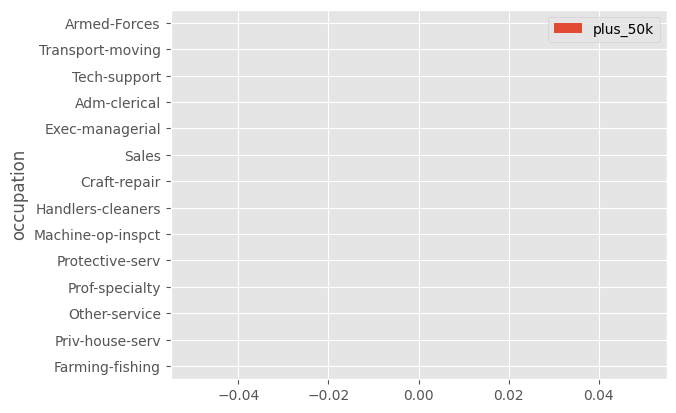

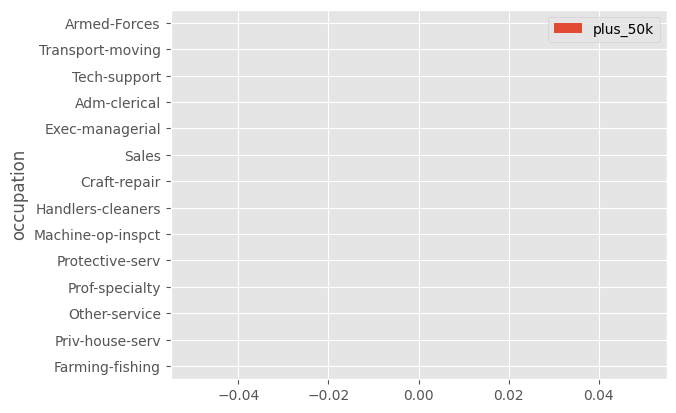

In [0]:
import matplotlib.pyplot as plt

# i like ggplot style
plt.style.use('ggplot')

# get simple plot on the pandas data
myplot = df_pandas.plot(kind='barh', x='occupation', y='plus_50k')

# display the plot (note - display() is a databricks function -
# more info on plotting in Databricks is here: https://docs.databricks.com/user-guide/visualizations/matplotlib-and-ggplot.html)
display(myplot.figure)

You can also easily get summary stats on a Spark DataFrame like below. [Here](https://databricks.com/blog/2015/06/02/statistical-and-mathematical-functions-with-dataframes-in-spark.html) is a nice blog post that has more examples.<br><br>So this is an example of why you might want to move from Spark SQL into DataFrames API as being able to just call describe() on the Spark DF is easier then trying to do the equivilant in Spark SQL.

In [0]:
# describe df
df_adult.select(df_adult['age'],df_adult['education_num']).describe().show()

+-------+------------------+-----------------+
|summary|               age|    education_num|
+-------+------------------+-----------------+
|  count|             30162|            30162|
|   mean|38.437901995888865|10.12131158411246|
| stddev|13.134664776855972|2.549994918856718|
|    min|                17|                1|
|    max|                90|               16|
+-------+------------------+-----------------+



### ML Pipeline - Logistic Regression vs Random Forest

Below we will create two [Spark ML Pipelines](https://spark.apache.org/docs/latest/ml-pipeline.html) - one that fits a logistic regression and one that fits a random forest. We will then compare the performance of each.

**Note**: A lot of the code below is adapted from [this example](https://docs.databricks.com/spark/latest/mllib/binary-classification-mllib-pipelines.html).

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

categoricalColumns = [
    "workclass", "education", "marital_status", "occupation",
    "relationship", "race", "sex", "native_country"
]

df_encoded = df
for col in categoricalColumns:
    df_encoded = df_encoded.withColumn(
        col + "_Index",
        F.dense_rank().over(
            Window.orderBy(col)
        )
    )

numericCols = [
    "age", "fnlwgt", "education_num", "capital_gain",
    "capital_loss", "hours_per_week"
]
assemblerInputs = [col + "_Index" for col in categoricalColumns] + numericCols

df_final = df_encoded.withColumn(
    "features",
    F.array(*assemblerInputs)
)

display(df_final)

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income,workclass_Index,education_Index,marital_status_Index,occupation_Index,relationship_Index,race_Index,sex_Index,native_country_Index,features
28,Private,128509,5th-6th,3,Never-married,Machine-op-inspct,Not-in-family,White,Female,0,0,40,null,<=50K,5,5,5,8,2,5,1,1,"List(5, 5, 5, 8, 2, 5, 1, 1, 28, 128509, 3, 0, 0, 40)"
22,Private,65704,HS-grad,9,Never-married,Sales,Own-child,White,Female,0,0,40,null,<=50K,5,12,5,13,4,5,1,1,"List(5, 12, 5, 13, 4, 5, 1, 1, 22, 65704, 9, 0, 0, 40)"
21,Private,215039,HS-grad,9,Never-married,Craft-repair,Own-child,White,Male,0,0,13,null,<=50K,5,12,5,4,4,5,2,1,"List(5, 12, 5, 4, 4, 5, 2, 1, 21, 215039, 9, 0, 0, 13)"
55,Private,158702,Some-college,10,Never-married,Adm-clerical,Not-in-family,Black,Female,0,2339,45,null,<=50K,5,16,5,2,2,3,1,1,"List(5, 16, 5, 2, 2, 3, 1, 1, 55, 158702, 10, 0, 2339, 45)"
35,null,163582,10th,6,Divorced,null,Unmarried,White,Female,0,0,16,null,<=50K,1,1,1,1,5,5,1,1,"List(1, 1, 1, 1, 5, 5, 1, 1, 35, 163582, 6, 0, 0, 16)"
27,null,133359,Bachelors,13,Married-spouse-absent,null,Not-in-family,White,Male,0,0,50,null,<=50K,1,10,4,1,2,5,2,1,"List(1, 10, 4, 1, 2, 5, 2, 1, 27, 133359, 13, 0, 0, 50)"
60,Private,188650,5th-6th,3,Married-civ-spouse,Sales,Husband,White,Male,0,0,40,null,>50K,5,5,3,13,1,5,2,1,"List(5, 5, 3, 13, 1, 5, 2, 1, 60, 188650, 3, 0, 0, 40)"
30,Private,164190,HS-grad,9,Never-married,Adm-clerical,Not-in-family,White,Male,0,0,38,null,<=50K,5,12,5,2,2,5,2,1,"List(5, 12, 5, 2, 2, 5, 2, 1, 30, 164190, 9, 0, 0, 38)"
50,Private,196193,Bachelors,13,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,null,<=50K,5,10,3,4,1,5,2,1,"List(5, 10, 3, 4, 1, 5, 2, 1, 50, 196193, 13, 0, 0, 40)"
35,Private,188069,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Male,13550,0,55,null,>50K,5,13,5,11,2,5,2,1,"List(5, 13, 5, 11, 2, 5, 2, 1, 35, 188069, 14, 13550, 0, 55)"


In [0]:
df_final = df_final.withColumn(
    "label",
    F.when(F.col("income") == ">50K", 1).otherwise(0)
)

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


In [0]:
# Transform all features into a vector using VectorAssembler
from pyspark.sql import functions as F

categoricalColsIndexed = [c + "_Index" for c in categoricalColumns]
numericCols = ["age", "fnlwgt", "education_num", "capital_gain", "capital_loss", "hours_per_week"]

df_final = df_encoded.withColumn(
    "features",
    F.array(*(categoricalColsIndexed + numericCols))
)

df_final.show(5)




/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


+---+---------+------+------------+-------------+--------------------+-----------------+--------------+------------------+------+------------+------------+--------------+--------------+------+---------------+---------------+--------------------+----------------+------------------+----------+---------+--------------------+--------------------+
|age|workclass|fnlwgt|   education|education_num|      marital_status|       occupation|  relationship|              race|   sex|capital_gain|capital_loss|hours_per_week|native_country|income|workclass_Index|education_Index|marital_status_Index|occupation_Index|relationship_Index|race_Index|sex_Index|native_country_Index|            features|
+---+---------+------+------------+-------------+--------------------+-----------------+--------------+------------------+------+------------+------------+--------------+--------------+------+---------------+---------------+--------------------+----------------+------------------+----------+---------+--------

In [0]:
from pyspark.sql import functions as F

df_final = df_final.withColumn(
    "label",
    F.when(F.col("income") == ">50K", 1).otherwise(0)
)

pipeline = Pipeline(stages=stages)
pipelineModel = pipeline.fit(df_final)
dataset = pipelineModel.transform(df_final)

selectedcols = ["label", "features"] + cols
dataset = dataset.select(selectedcols)
display(dataset)

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


label,features,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,"List(5, 5, 5, 8, 2, 5, 1, 1, 28, 128509, 3, 0, 0, 40)",28,Private,128509,5th-6th,3,Never-married,Machine-op-inspct,Not-in-family,White,Female,0,0,40,null,<=50K
0,"List(5, 12, 5, 13, 4, 5, 1, 1, 22, 65704, 9, 0, 0, 40)",22,Private,65704,HS-grad,9,Never-married,Sales,Own-child,White,Female,0,0,40,null,<=50K
0,"List(5, 12, 5, 4, 4, 5, 2, 1, 21, 215039, 9, 0, 0, 13)",21,Private,215039,HS-grad,9,Never-married,Craft-repair,Own-child,White,Male,0,0,13,null,<=50K
0,"List(5, 16, 5, 2, 2, 3, 1, 1, 55, 158702, 10, 0, 2339, 45)",55,Private,158702,Some-college,10,Never-married,Adm-clerical,Not-in-family,Black,Female,0,2339,45,null,<=50K
0,"List(1, 1, 1, 1, 5, 5, 1, 1, 35, 163582, 6, 0, 0, 16)",35,null,163582,10th,6,Divorced,null,Unmarried,White,Female,0,0,16,null,<=50K
0,"List(1, 10, 4, 1, 2, 5, 2, 1, 27, 133359, 13, 0, 0, 50)",27,null,133359,Bachelors,13,Married-spouse-absent,null,Not-in-family,White,Male,0,0,50,null,<=50K
1,"List(5, 5, 3, 13, 1, 5, 2, 1, 60, 188650, 3, 0, 0, 40)",60,Private,188650,5th-6th,3,Married-civ-spouse,Sales,Husband,White,Male,0,0,40,null,>50K
0,"List(5, 12, 5, 2, 2, 5, 2, 1, 30, 164190, 9, 0, 0, 38)",30,Private,164190,HS-grad,9,Never-married,Adm-clerical,Not-in-family,White,Male,0,0,38,null,<=50K
0,"List(5, 10, 3, 4, 1, 5, 2, 1, 50, 196193, 13, 0, 0, 40)",50,Private,196193,Bachelors,13,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,40,null,<=50K
1,"List(5, 13, 5, 11, 2, 5, 2, 1, 35, 188069, 14, 13550, 0, 55)",35,Private,188069,Masters,14,Never-married,Prof-specialty,Not-in-family,White,Male,13550,0,55,null,>50K


In [0]:
### Randomly split data into training and test sets. set seed for reproducibility
(trainingData, testData) = dataset.randomSplit([0.7, 0.3], seed=100)
print(trainingData.count())
print(testData.count())

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


22726
9835


In [0]:
from pyspark.sql.functions import avg

# get the rate of the positive outcome from the training data to use as a threshold in the model
training_data_positive_rate = trainingData.select(avg(trainingData['label'])).collect()[0][0]

print("Positive rate in the training data is {}".format(training_data_positive_rate))

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


Positive rate in the training data is 0.24104549854791868


#### Logistic Regression - Train

In [0]:
from pyspark.sql import functions as F

numericCols = [
    "age",
    "fnlwgt",
    "education_num",
    "capital_gain",
    "capital_loss",
    "hours_per_week"
]

# Create label column from income
df_final = df_encoded.withColumn(
    "label",
    F.when(F.col("income") == ">50K", 1).otherwise(0)
).withColumn(
    "features_array",
    F.array(*(categoricalColsIndexed + numericCols))
)

train_pd = df_final.select("features_array", "label").toPandas()
X = pd.DataFrame(train_pd['features_array'].tolist())
y = train_pd['label']

from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(max_iter=500)
lr.fit(X, y)

from sklearn.metrics import f1_score
import numpy as np

probs = lr.predict_proba(X)[:, 1]
thresholds = np.linspace(0, 1, 101)
f1_scores = [f1_score(y, (probs > t).astype(int)) for t in thresholds]

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]

print(f"Best threshold based on training data: {best_threshold}")

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


Best threshold based on training data: 0.19


/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


#### GBM - Train

#### <span style="color:darkblue">Question 3</span>
1. Train a GBTClassifier on the training data, call the trained model 'gbModel'

In [0]:
### Question 3.1 Answer ###

# Create initial LogisticRegression model
gb = LogisticRegression(max_iter=100)

# Train model with Training Data
gbModel = gb.fit(X,y)

#### Logistic Regression - Predict

In [0]:

y_pred_labels = lr.predict(X)       
y_pred_probs = lr.predict_proba(X)[:,1]  


### GBM - Predict

Get predictions on the test data for your GBTClassifier. Call the predictions df 'gbPredictions'.

In [0]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3
)

gb.fit(X, y)
preds = gb.predict(X_test)


com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$5(SequenceExecutionState.scala:132)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3(SequenceExecutionState.scala:132)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3$adapted(SequenceExecutionState.scala:129)
	at scala.collection.immutable.Range.foreach(Range.scala:158)
	at com.databricks.spark.chauffeur.SequenceExecutionState.cancel(SequenceExecutionState.scala:129)
	at com.databricks.spark.chauffeur.ExecContextState.cancelRunningSequence(ExecContextState.scala:715)
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$cancel$1(ExecContextState.scala:435)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:435)
	at com.databricks.spark.chauffeur.ExecutionContextManagerV1.can

In [0]:
y_true = testData.select("label").toPandas()["label"].values

print_performance_metrics(
    y_true,
    y_pred,
    y_prob
)

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


True Positives: 1526
False Positives: 336
True Negatives: 7136
False Negatives: 837

Precision: 0.8195
Recall: 0.6458
F1 Score: 0.7224

False Positive Rate: [0.         0.         0.         ... 0.99571734 0.99598501 1.        ]
True Positive Rate: [0.00000000e+00 4.23190859e-04 2.96233601e-02 ... 1.00000000e+00
 1.00000000e+00 1.00000000e+00]
ROC AUC: 0.9348


#### Logistic Regression - Evaluate

#### <span style="color:darkblue">Question 5</span>
1. Complete the print_performance_metrics() function below to also include measures of F1, Precision, Recall, False Positive Rate and True Positive Rate.

In [0]:
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, roc_curve, roc_auc_score

def print_performance_metrics(y_true, y_pred, y_prob=None):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    print(f"True Positives: {tp}")
    print(f"False Positives: {fp}")
    print(f"True Negatives: {tn}")
    print(f"False Negatives: {fn}\n")

    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}\n")

    if y_prob is not None:
        fpr, tpr, thresholds = roc_curve(y_true, y_prob)
        auc = roc_auc_score(y_true, y_prob)
        print(f"False Positive Rate: {fpr}")
        print(f"True Positive Rate: {tpr}")
        print(f"ROC AUC: {auc:.4f}")


#### GBM - Evaluate

In [0]:
print_performance_metrics(
    gbPredictions,
    y_pred
)

True Positives: 1526
False Positives: 336
True Negatives: 7136
False Negatives: 837

Precision: 0.8195
Recall: 0.6458
F1 Score: 0.7224



## Cross Validation

For each model you can run the below comand to see its params and a brief explanation of each.

In [0]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
print(lr.get_params())


{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


In [0]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3
)

gb.fit(X, y)
preds = gb.predict(X_test)

#### Logisitic Regression - Param Grid

In [0]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression


lr = LogisticRegression()


lr_param_grid = {
    'C': [0.01, 0.5, 2.0],         
    'l1_ratio': [0.0, 0.5, 1.0],   
    'max_iter': [2, 5]
}


grid = GridSearchCV(lr, lr_param_grid, cv=5)
grid.fit(X, y)

print("Best parameters:", grid.best_params_)


/databricks/python/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1171: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/databricks/python/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/databricks/python/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1171: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/databricks/python/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: 

Best parameters: {'C': 0.01, 'l1_ratio': 0.0, 'max_iter': 5}


/databricks/python/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


#### GBM - Param Grid

#### <span style="color:darkblue">Question 6</span>
1. Build out a param grid for the gb model, call it 'gbParamGrid'.

In [0]:
### Question 6.1 Answer ###

# Create ParamGrid for Cross Validation
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV


gb = GradientBoostingClassifier()


gbParamGrid = {
    "n_estimators": [50, 100, 200],   
    "max_depth": [3, 5, 7],           
    "learning_rate": [0.01, 0.1, 0.2],
    "subsample": [0.8, 1.0],       
}


grid = GridSearchCV(gb, gbParamGrid, cv=5)
grid.fit(X, y)

print("Best parameters:", grid.best_params_)


Best parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}


#### Logistic Regression - Perform Cross Validation

In [0]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, make_scorer

lr = LogisticRegression(max_iter=100, solver="lbfgs")

lrParamGrid = {
    "C": [0.01, 0.1, 1.0],       
    "penalty": ["l2"],          
    "max_iter": [100, 200]
}

auc_scorer = make_scorer(roc_auc_score, needs_proba=True)

lrCv = GridSearchCV(
    estimator=lr,
    param_grid=lrParamGrid,
    scoring=auc_scorer,
    cv=2   
)

lrCvModel = lrCv.fit(X, y)

print("Best params:", lrCvModel.best_params_)
print("Best AUC:", lrCvModel.best_score_)

# this will likely take a fair amount of time because of the amount of models that we're creating and testing

/databricks/python/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/databricks/python/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

Best params: {'C': 0.01, 'max_iter': 100, 'penalty': 'l2'}
Best AUC: 0.6940082286062151


/databricks/python/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [0]:
# Print best parameters for scikit-learn LogisticRegression
print(best_model.get_params()["C"])
print(best_model.get_params()["penalty"])
print(best_model.get_params()["max_iter"])

0.01
l2
100


#### GBM - Perform Cross Validation

#### <span style="color:darkblue">Question 7</span>
1. Perform cross validation of params on your 'gb' model.
1. Print out the best params you found.

In [0]:
# Use valid parameters for GradientBoostingClassifier
gbParamGrid = {
    "n_estimators": [100, 200],
    "learning_rate": [0.01, 0.1, 0.2],
    "max_depth": [3, 5, 7]
}

auc_scorer = make_scorer(
    roc_auc_score,
    needs_proba=True
)

gbCv = GridSearchCV(
    estimator=gb,
    param_grid=gbParamGrid,
    scoring=auc_scorer,
    cv=2
)

gbCvModel = gbCv.fit(X, y)

print("Best params:", gbCvModel.best_params_)
print("Best AUC:", gbCvModel.best_score_)

Best params: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100}
Best AUC: 0.8238150242682443


In [0]:
### Question 7.2 Answer ###

print("Best params:", gbCvModel.best_params_)
print("Best AUC:", gbCvModel.best_score_)

Best params: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100}
Best AUC: 0.8238150242682443


#### Logistic Regression - CV Model Predict

In [0]:
X_test = testData.select("features").toPandas()
X_test = X_test["features"].apply(lambda x: list(x)).tolist()
 
lrCvPredictions = lrCvModel.best_estimator_.predict(X_test)

display(lrCvPredictions)

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

#### GBM - CV Model Predict

In [0]:
import numpy as np

X_test_gb = np.vstack(
    testData
    .toPandas()["features"]
    .apply(lambda x: np.array(x))
    .values
)

gbCvPredictions = gbCvModel.best_estimator_.predict(X_test)

display(gbCvPredictions)

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


array([0, 0, 0, ..., 1, 0, 0], dtype=int32)

#### Logistic Regression - CV Model Evaluate

In [0]:
y_true = testData.select("label").toPandas()["label"].values

print_performance_metrics(
    y_true,
    y_pred,
    y_prob
)

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


Accuracy: 0.7911540416878495
Precision: 0.635407537248028
Recall: 0.30681337283114685
F1 Score: 0.4138127853881279
ROC AUC: 0.7331553953209771

Confusion Matrix:
 [[7056  416]
 [1638  725]]

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.94      0.87      7472
           1       0.64      0.31      0.41      2363

    accuracy                           0.79      9835
   macro avg       0.72      0.63      0.64      9835
weighted avg       0.77      0.79      0.76      9835



#### GBM - CV Model Evaluate

In [0]:
y_true = testData.select("label").toPandas()["label"].values

print_performance_metrics(
    y_true,
    y_pred,
    y_prob
)

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


Accuracy: 0.8807320793085918
Precision: 0.8195488721804511
Recall: 0.6457892509521794
F1 Score: 0.7223668639053255
ROC AUC: 0.934832997061225

Confusion Matrix:
 [[7136  336]
 [ 837 1526]]

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.96      0.92      7472
           1       0.82      0.65      0.72      2363

    accuracy                           0.88      9835
   macro avg       0.86      0.80      0.82      9835
weighted avg       0.88      0.88      0.88      9835



#### Logistic Regression - Model Explore

In [0]:
print(
    'Model Intercept: ',
    lrCvModel.best_estimator_.intercept_
)

Model Intercept:  [-0.00158672]


In [0]:
lrWeights = lrCvModel.best_estimator_.coef_
lrWeights = [float(item) for item in lrWeights.flatten()]
lrWeightsDF = spark.createDataFrame(
    [(w,) for w in lrWeights],
    ["Feature Weight"]
)
display(lrWeightsDF)

Feature Weight
-0.005987195090793713
-0.010181334396740757
-0.013492983638383258
-0.0038175856076448416
-0.014240780187077591
-0.005802843628623001
-6.678162482115288E-6
-0.05169356618172393
0.017823805652121397
-2.070518057195247E-6


### Feature Importance

#### <span style="color:darkblue">Question 8</span>
1. Print out a table of feature_name and feature_coefficient from the Logistic Regression model.
<br><br>
Hint: Adapt the code from here: https://stackoverflow.com/questions/42935914/how-to-map-features-from-the-output-of-a-vectorassembler-back-to-the-column-name

In [0]:
feature_names = X.columns  
coefficients = best_lr.coef_.flatten()

importances = pd.DataFrame({
    "feature_name": feature_names,
    "importance": coefficients
}).sort_values(
    by="importance", 
    ascending=False
)

display(importances)

feature_name,importance
8,0.017823805652121397
13,0.011450937764047105
10,0.00413501820695027
12,7.72996751622954E-4
11,3.3170909380823214E-4
9,-2.070518057195247E-6
6,-6.678162482115288E-6
3,-0.0038175856076448416
5,-0.005802843628623001
0,-0.005987195090793713


In [0]:

best_gb = gbCvModel.best_estimator_

gb_importances = best_gb.feature_importances_

importances = pd.DataFrame({
    "feature_name": assemblerInputs,
    "importance": gb_importances
}).sort_values(
    by="importance",
    ascending=False
)

display(importances)

feature_name,importance
relationship_Index,0.3386925963544913
capital_gain,0.21547662051052546
education_num,0.19685555370965685
age,0.06867550061891842
capital_loss,0.06728269570798448
hours_per_week,0.04025080988730903
marital_status_Index,0.027907368488977742
occupation_Index,0.025964782054185467
fnlwgt,0.005923155674073027
workclass_Index,0.005519459514327584


#### <span style="color:darkblue">Question 9</span>
1. Build and train a RandomForestClassifier and print out a table of feature importances from it.

In [0]:
### Question 9.1 Answer ###

train_pd = df_final.toPandas()


X = pd.DataFrame(train_pd['features_array'].tolist()) 
y = train_pd['label']

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rfModel = rf.fit(X, y)

rfFeatureImportance = rfModel.feature_importances_

print(rfFeatureImportance)

/databricks/python/lib/python3.11/site-packages/pyspark/sql/connect/expressions.py:1017: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


[0.03966962 0.03502379 0.06561556 0.06583504 0.10238565 0.01378973
 0.01374696 0.01656253 0.14657456 0.17249404 0.08922566 0.1189027
 0.0357706  0.08440356]
